# Classificazione: predizione del reddito
Studenti: Giuseppe Lischio, Tommaso Lo Bello, Filippo Vasone

Questo dataset proviene da [Kaggle](https://www.kaggle.com/datasets/uciml/adult-census-income/data) e contiene records relativi al censimento degli Stati Uniti del 1994. Le informazioni sono state utilizzate per predire se un individuo ha un reddito annuale superiore o inferiore ai 50K dollari.

Il dataset contiene le seguenti variabili:
- age (numerica)
- workclass (categorica)
- fnlwgt (numerica)
- education (categorica)
- education.num (categorica ordinale)
- marital.status (categorica)
- occupation (categorica)
- relationship (categorica)
- race (categorica)
- sex (categorica)
- capital.gain (numerica)
- capital.loss (numerica)
- hours.per.week (numerica)
- native.country (categorica)
- income (categorica)

## Importare le librerie necessarie

In [ ]:
# Load libraries - RICONTROLLARE ALLA FINE
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from sklearn.model_selection import GridSearchCV # for parameter tuning
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
%matplotlib inline
#the plots will be displayed in a cell and stored in the notebook document.
from matplotlib import pyplot as plt
plt.style.use('ggplot') # Using ggplot2 style visuals

from sklearn.metrics import ConfusionMatrixDisplay

import seaborn as sns
sns.set()

## Caricamento del dataset

In [ ]:
# load dataset
adult = pd.read_csv("adult.csv")
adult.head() # show the first 5 rows of the dataset

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


## Data Exploration

In questa fase, esploriamo i valori che assumono le diverse variabili e realizziamo delle visualizzazioni.
- analisi statistica descrittiva di base delle variabili quantitative
- visualizzazione di tutti i possibili valori (analisi di dominio) che assume una certa variabile categorica
- controlli sulla qualità dei dati (i problemi emersi saranno affrontati nella fase di preprocessing)
  - conteggio dei missing ("?")
  - eliminazione di fnlwgt a priori
  - ricerca e legittimità dei duplicati
  - matching *education* vs *education_num*
  - gli zeri in *capital_gain* e *capital_loss*
- visualizzazioni di base:
  - istogrammi/barplot per la visualizzazione della distribuzione delle variabili
  - boxplot
  - pairplot
  - heatmap con coefficiente di correlazione

In [ ]:
# show basic info about our dataset
adult.info()
# apparently, there are no non-null values.
# However in the first five rows of the dataset we showed above, we saw that there are missing values referred to as "?"

# show basic descriptive statistics about the numerical variables of our dataset
adult.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education.num   32561 non-null  int64 
 5   marital.status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital.gain    32561 non-null  int64 
 11  capital.loss    32561 non-null  int64 
 12  hours.per.week  32561 non-null  int64 
 13  native.country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


,age,fnlwgt,education.num,capital.gain,capital.loss,hours.per.week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [ ]:
## show all the unique values of the categorical variables
 # esempio di codice che io eliminerei perchè tanto c'è già sotto
 # nativeCountry = adult['native_country'].unique()
 # print(nativeCountry)

adult.rename(
    columns={"education.num": "education_num",
             "hours.per.week": "hours_per_week",
             "marital.status": "marital_status",
             "native.country": "native_country",
             "capital.loss": "capital_loss",
             "capital.gain": "capital_gain"
             }, inplace=True
)

# create a list of the categorical variables by removing the numerical ones
column_names = list(adult.columns.values)
# print(column_names)
numerical_column_names = ["age", "fnlwgt", "education_num", "capital_gain", "capital_loss", "hours_per_week"]
categorical_column_names = [elem for elem in column_names if elem not in numerical_column_names]
# print(categorical_column_names)

# create a for loop that shows all the unique values for each categorical variable
for column in categorical_column_names:
  column = adult[column].unique()
  print(column)

['?' 'Private' 'State-gov' 'Federal-gov' 'Self-emp-not-inc' 'Self-emp-inc'
 'Local-gov' 'Without-pay' 'Never-worked']
['HS-grad' 'Some-college' '7th-8th' '10th' 'Doctorate' 'Prof-school'
 'Bachelors' 'Masters' '11th' 'Assoc-acdm' 'Assoc-voc' '1st-4th' '5th-6th'
 '12th' '9th' 'Preschool']
['Widowed' 'Divorced' 'Separated' 'Never-married' 'Married-civ-spouse'
 'Married-spouse-absent' 'Married-AF-spouse']
['?' 'Exec-managerial' 'Machine-op-inspct' 'Prof-specialty'
 'Other-service' 'Adm-clerical' 'Craft-repair' 'Transport-moving'
 'Handlers-cleaners' 'Sales' 'Farming-fishing' 'Tech-support'
 'Protective-serv' 'Armed-Forces' 'Priv-house-serv']
['Not-in-family' 'Unmarried' 'Own-child' 'Other-relative' 'Husband' 'Wife']
['White' 'Black' 'Asian-Pac-Islander' 'Other' 'Amer-Indian-Eskimo']
['Female' 'Male']
['United-States' '?' 'Mexico' 'Greece' 'Vietnam' 'China' 'Taiwan' 'India'
 'Philippines' 'Trinadad&Tobago' 'Canada' 'South' 'Holand-Netherlands'
 'Puerto-Rico' 'Poland' 'Iran' 'England' 'Germ

Notiamo che ci sono dei valori che sono indicati con "?" e che presumibilmente corrispondono a valori missing. Ora contiamo questi valori.

### Conteggio dei valori '?'


In [ ]:
#creating a variable that contains the count of '?' values ​​for each attribute
question_marks = (adult == '?').sum()
print(question_marks)


#creating a variable that contains the count of missing values ​​for each attribute
missing = adult.isnull().sum()
print('\n', missing)

age                  0
workclass         1836
fnlwgt               0
education            0
education_num        0
marital_status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital_gain         0
capital_loss         0
hours_per_week       0
native_country     583
income               0
dtype: int64

 age               0
workclass         0
fnlwgt            0
education         0
education_num     0
marital_status    0
occupation        0
relationship      0
race              0
sex               0
capital_gain      0
capital_loss      0
hours_per_week    0
native_country    0
income            0
dtype: int64


Da questa esplorazione si evince come i valori missing siano stati sostituiti dal carattere '?' durante la compilazione del dataset. Nella fase di preprocessing sostituiremo '?' con valori NaN.

### Eliminazione della variabile fnlwgt
La variabile fnlwgt viene descritta dalla [documentazione](https://www.kaggle.com/datasets/uciml/adult-census-income) del dataset come un peso, assegnato dal Census Bureau, che indica delle caratteristiche demografiche dell'individuo: se due individui hanno un valore per fnlwgt simile, allora hanno caratteristiche simili.

Tuttavia, questo peso ha una scala diversa a seconda dello Stato degli Stati Uniti in cui l'individuo per cui è stato calcolato si trova. Dal momento che nel dataset non ci sono indicazioni sullo Stato degli individui, non è possibile utilizzare questa variabile in modo sensato. Ad esempio, una persona dall'Ohio e dall'Illinois potrebbero avere fnlwgt simili ma caratteristiche demografiche diverse.

Per questo motivo, abbiamo deciso a priori di non considerarla nella nostra analisi e di eliminarla già nella fase di data exploration e non nel preprocessing.

In [ ]:
adult.drop(columns = 'fnlwgt', inplace = True)
#drop useless column 'fnlwgt'
#può dare problemi se runnata più volte (non trova più fnlwgt)

adult.head()

,age,workclass,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,90,?,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


### Ricerca dei duplicati
Ricerchiamo duplicati nel dataset.

In [ ]:
adult.duplicated().sum()
# function that yields the total number of duplicated rows

3465

Ci sono duplicati nel dataset.

Dal momento che manca una colonna "id" che indichi un codice identificativo univoco per ogni osservazione e dato che le variabili del dataset si riferiscono a caratteristiche demografiche abbastanza generiche, è probabile che due persone abbiano attributi identici ma siano comunque due individui diversi.

Pertanto, assumiamo la legittimità dei duplicati.

### education vs education_num

La variabile *education* è una variabile categorica che indica i livelli di istruzione di una persona (che vanno da "preschool" a "doctorate"). La variabile *education_num* è il suo corrispondente numerico (con valori interi da 1 a 16).

Per verificare la pulizia dei dati, controlliamo che ad ogni valore di *education* corrisponda un solo valore di *education_num*.

Effettivamente corrisponde.  

In [ ]:
adult_education = adult.groupby(["education","education_num"]).size()
# Function that groups the dataset by education and education_num and that counts the number of rows for each group.
# We expect the function to return exactly 16 groups
print(adult_education)

print("The number of unique groups identifying the level of education is:", adult_education.size)

education     education_num
10th          6                  933
11th          7                 1175
12th          8                  433
1st-4th       2                  168
5th-6th       3                  333
7th-8th       4                  646
9th           5                  514
Assoc-acdm    12                1067
Assoc-voc     11                1382
Bachelors     13                5355
Doctorate     16                 413
HS-grad       9                10501
Masters       14                1723
Preschool     1                   51
Prof-school   15                 576
Some-college  10                7291
dtype: int64
The number of unique groups identifying the level of education is: 16


### capital_gain vs capital_loss

Controlliamo il numero di righe in cui gli attributi ***capital_gain*** e ***capital_loss*** sono contemporaneamente uguali a 0.

Oltre 28000 record risultano avere entrambe le colonne uguali a zero, perciò assumeremo che questi valori siano significativi (e non corrispondano ad un valore mancante) per l'analisi.

In [ ]:
adult_zeroCapital = adult.query('capital_loss == 0 and capital_gain == 0')
adult_zeroCapital.head()
print(len(adult_zeroCapital.index)) #N of rows with both capitals == 0

28330


### Visualizzazioni

- istogrammi/barplot per la visualizzazione della distribuzione
- boxplot
- pairplot
- heatmap con coefficiente di correlazione

#### Istogrammi
Visualizziamo la distribuzione delle variabili quantitative:
- *capital gain*
- *capital loss*
- *age*
- *hours per week*

(La variabile *education_num* non è veramente quantitativa, ma è qualitativa ordinale, quindi faremo il barplot nella prossima sezione)

<Axes: >

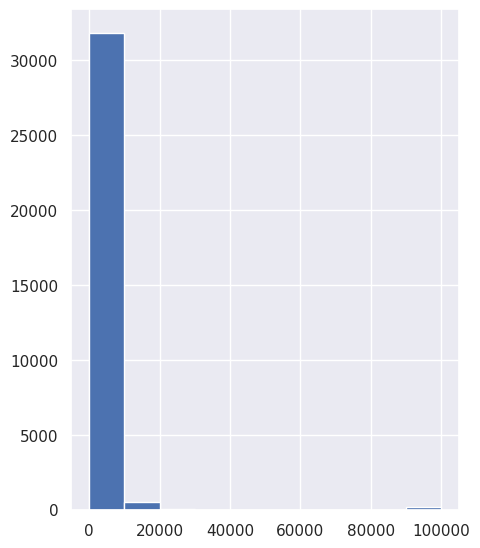

In [ ]:
adult["capital_gain"].hist(figsize =(5,6.5))

<Axes: >

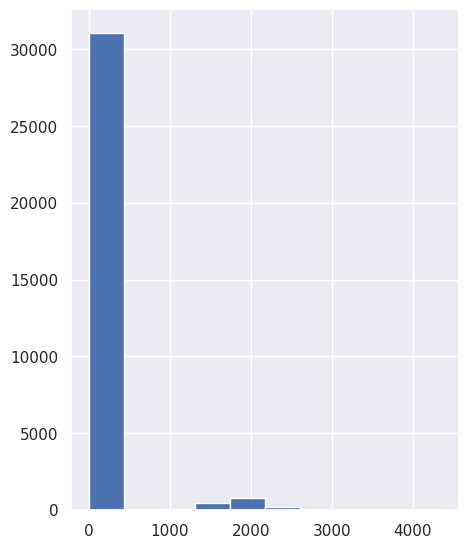

In [ ]:
adult["capital_loss"].hist(figsize =(5,6.5))
#histogram of the capital_loss variable

<Axes: >

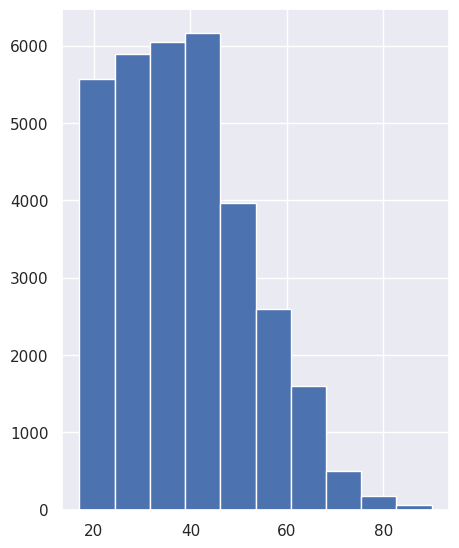

In [ ]:
adult["age"].hist(figsize =(5,6.5))
#histogram of the age variable

<Axes: >

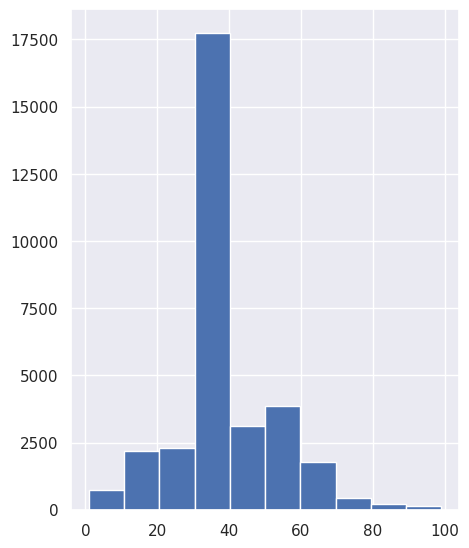

In [ ]:
adult["hours_per_week"].hist(figsize =(5,6.5))
# histogram of the hours_per_week variable

#### Barplot
Grafici a barre per visualizzare le frequenze delle variabili categoriche:
- workclass
- education
- education.num
- marital.status
- occupation
- relationship
- race
- sex
- native.country
- income

In alcuni grafici a barre, vedremo il conteggio anche dei valori '?', che verranno poi trasformati in valori NaN nel preprocessing.

<Axes: xlabel='count', ylabel='workclass'>

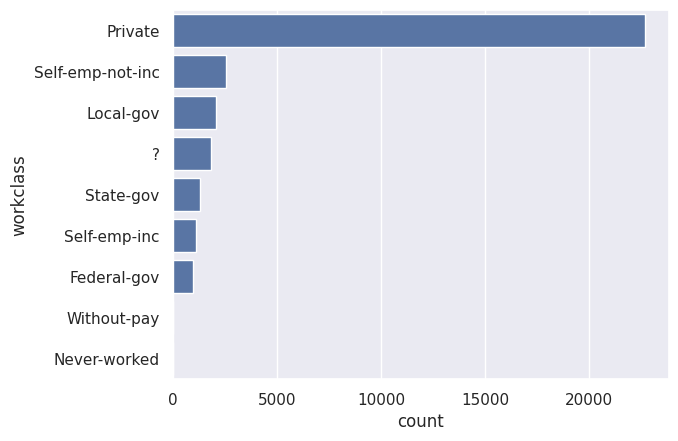

In [ ]:
sns.countplot(y="workclass", data = adult, order = adult["workclass"].value_counts().index )

<Axes: xlabel='education_num', ylabel='count'>

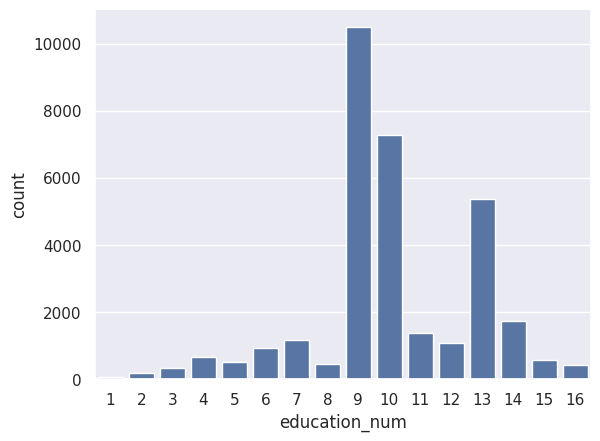

In [ ]:
sns.countplot(x="education_num", data=adult)

<Axes: xlabel='count', ylabel='education'>

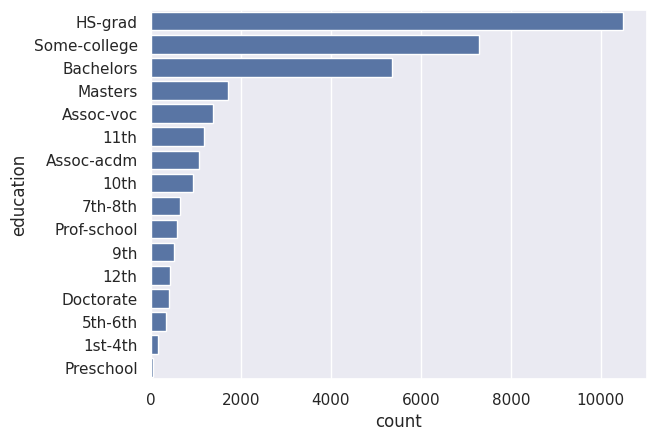

In [ ]:
sns.countplot(y="education", data = adult, order = adult["education"].value_counts().index)

<Axes: xlabel='count', ylabel='marital_status'>

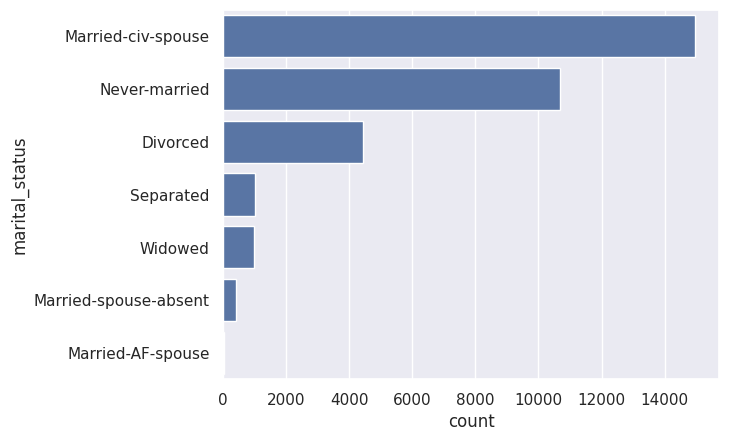

In [ ]:
sns.countplot(y="marital_status", data = adult, order = adult["marital_status"].value_counts().index)

<Axes: xlabel='count', ylabel='occupation'>

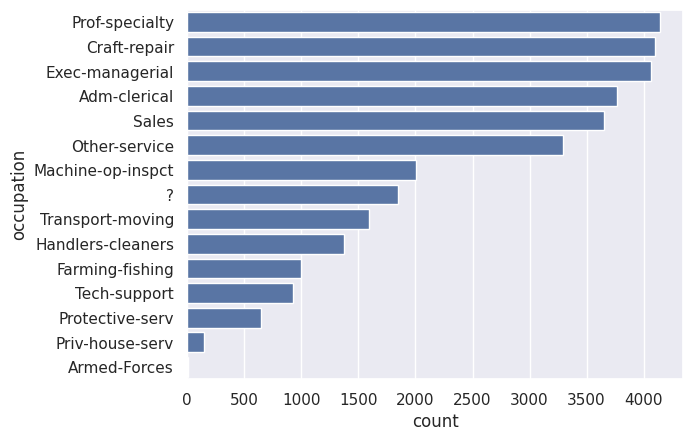

In [ ]:
sns.countplot(y="occupation", data = adult, order = adult["occupation"].value_counts().index)

<Axes: xlabel='count', ylabel='relationship'>

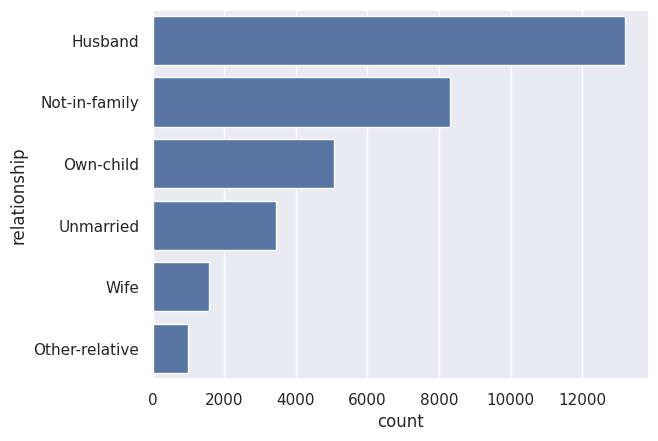

In [ ]:
sns.countplot(y="relationship", data = adult, order = adult["relationship"].value_counts().index)

<Axes: xlabel='count', ylabel='race'>

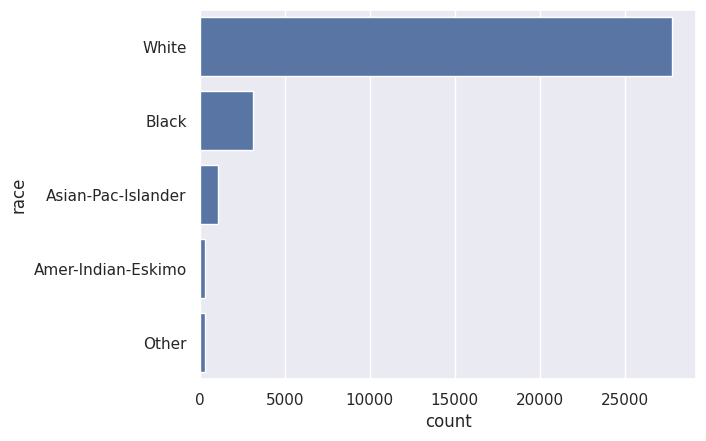

In [ ]:
sns.countplot(y="race", data = adult, order = adult["race"].value_counts().index)

<Axes: xlabel='count', ylabel='sex'>

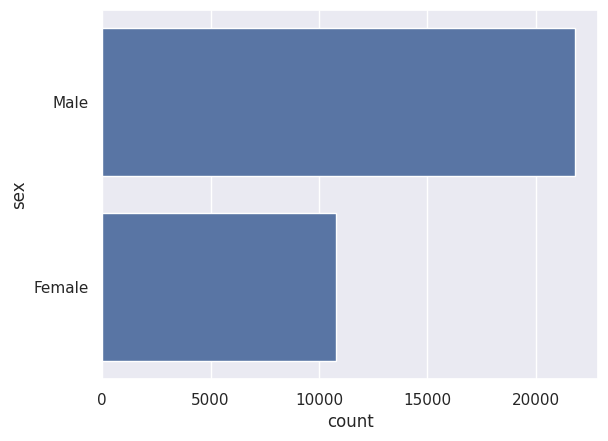

In [ ]:
sns.countplot(y="sex", data = adult, order = adult["sex"].value_counts().index)

<Axes: xlabel='count', ylabel='income'>

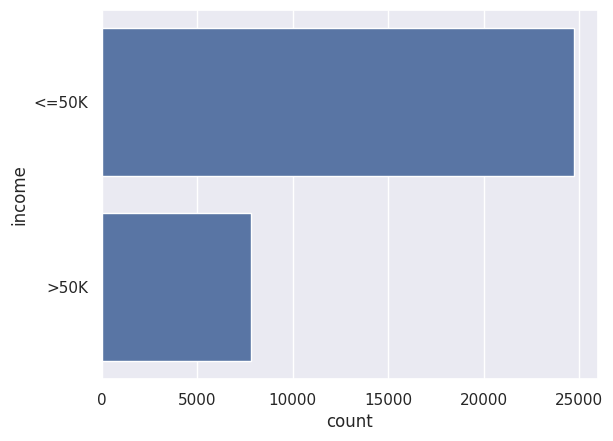

In [ ]:
sns.countplot(y="income", data = adult, order = adult["income"].value_counts().index)

Nel grafico seguente, per rendere la visualizzazione comprensibile, abbiamo deciso di escludere il conteggio delle frequenze degli individui il cui paese natale sono gli Stati Uniti, che costituiscono la stragrande maggioranza del dataset.

<Axes: xlabel='count', ylabel='native_country'>

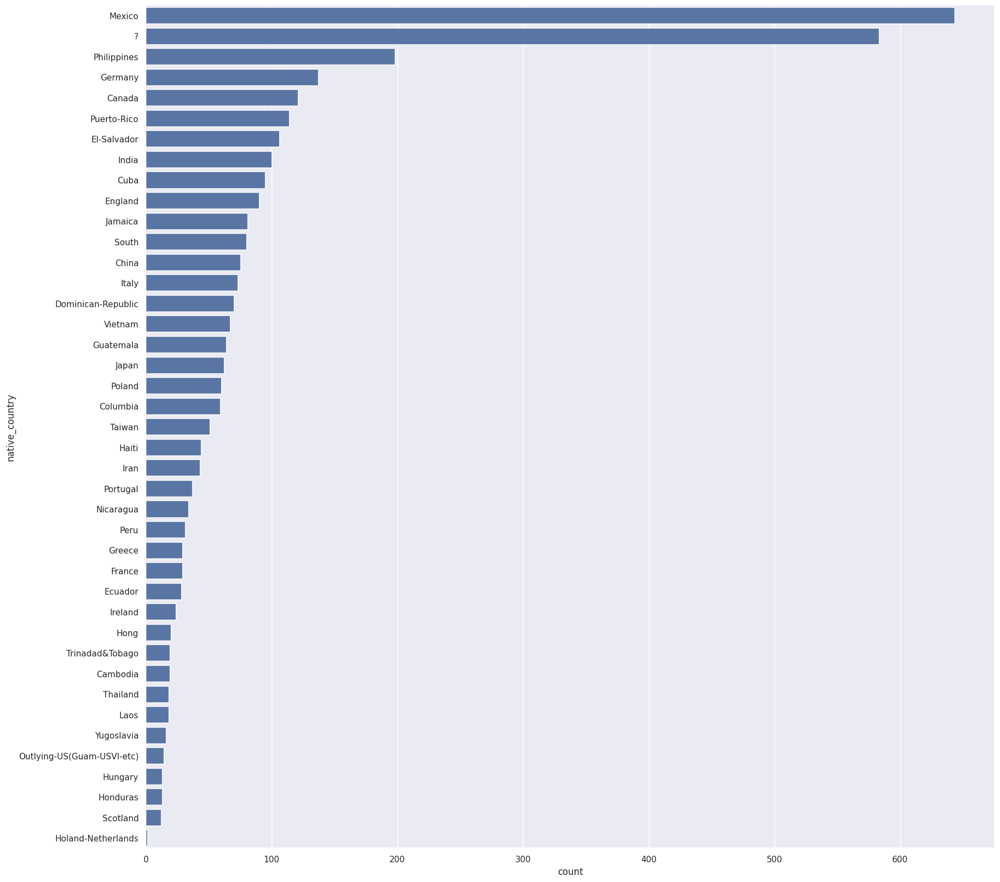

In [ ]:
adult_no_USA = adult.query("native_country != \"United-States\"")

plt.figure(figsize = (20,20)) #set the size of the plotfigure

#generate a horizotal barplot that count native_country for each country, excluding United-States
sns.countplot(y="native_country", data = adult_no_USA, order = adult_no_USA["native_country"].value_counts().index)

#### Boxplots

Plottiamo dei boxplot per tutto il dataset per capire la differenza nella distribuzione delle variabili numeriche

Nel secondo grafico escludiamo capital_gain e capital_loss per visualizzare meglio la distribuzione delle altre variabili

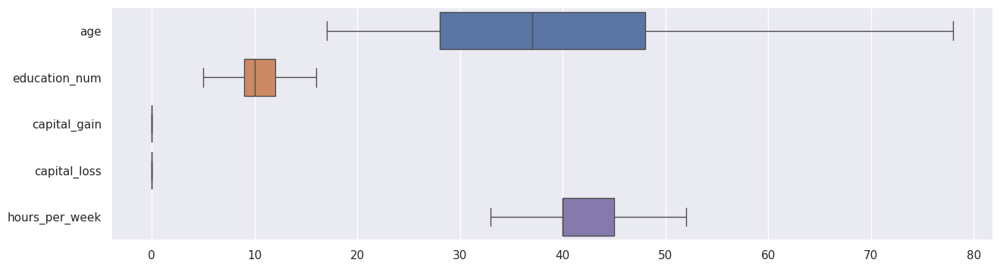

<Axes: >

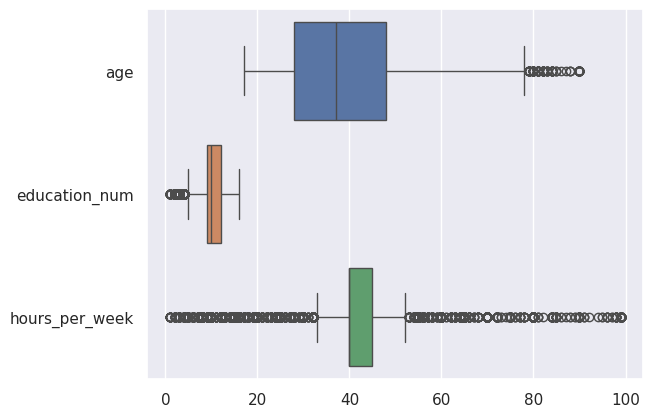

In [ ]:
plt.figure(figsize = (15,4))
sns.boxplot(data = adult, orient = "h", showfliers=False)
plt.show()

adult_noCapital = adult.drop(columns = ["capital_loss", "capital_gain"])
sns.boxplot(data = adult_noCapital, orient = "h")

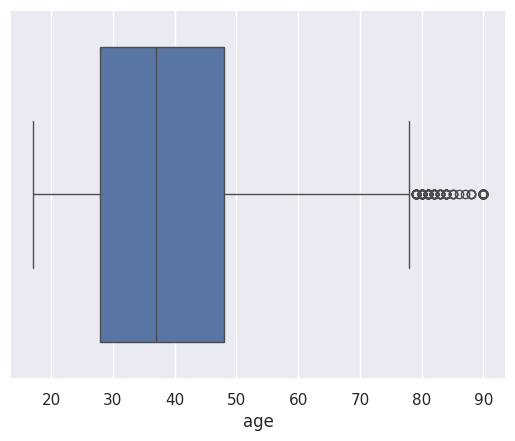

In [ ]:
boxplot_age = sns.boxplot(data = adult["age"], orient='h')


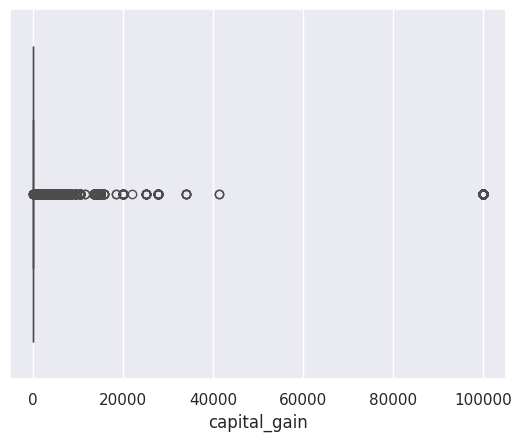

In [ ]:
boxplot_capgain = sns.boxplot(data = adult["capital_gain"], orient='h')


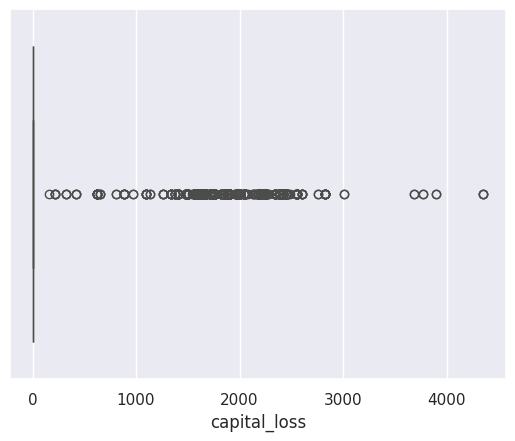

In [ ]:
boxplot_caploss = sns.boxplot(data = adult["capital_loss"], orient='h')


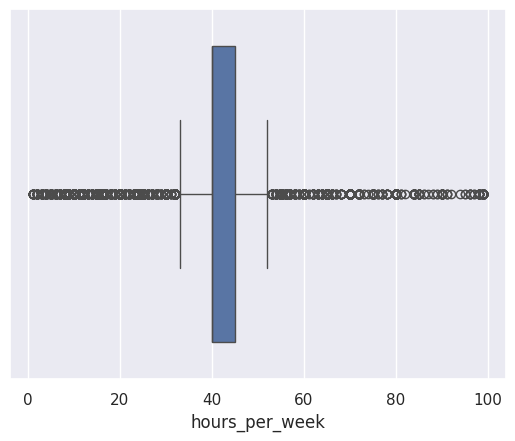

In [ ]:
boxplot_hrswk = sns.boxplot(data = adult["hours_per_week"], orient='h')

#### Pairplot
Combinazione di scatterplot per ogni variabile quantitativa

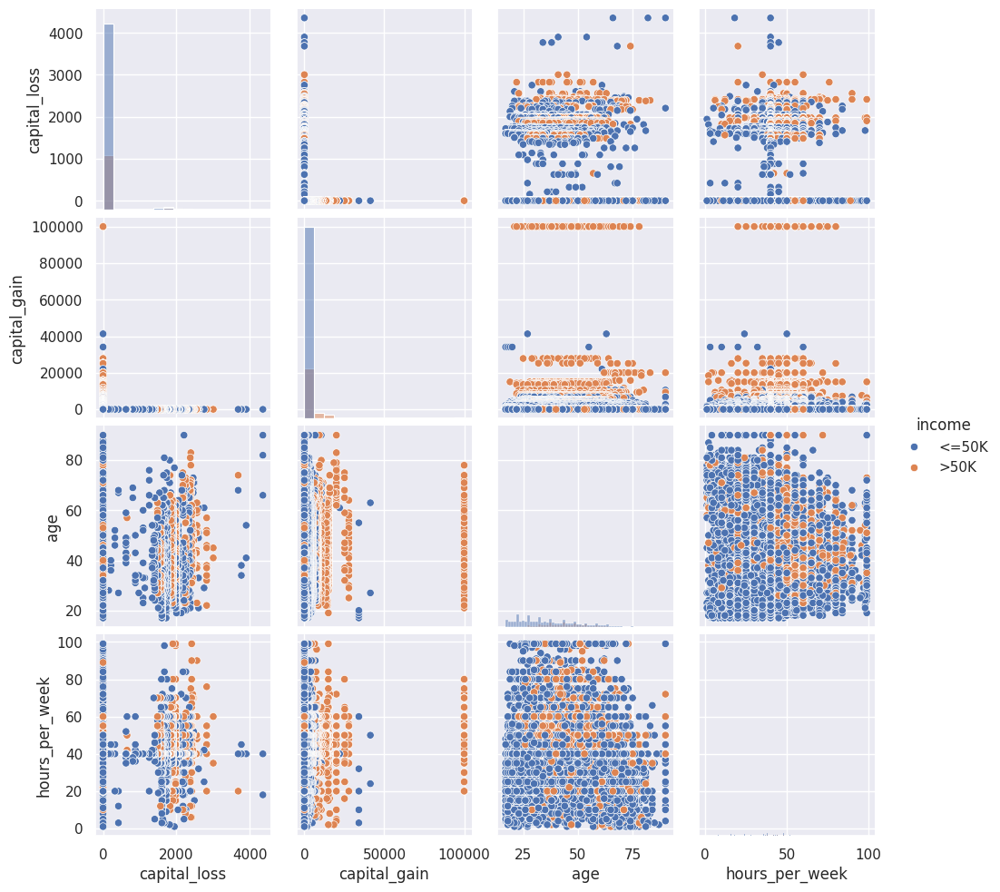

In [ ]:
sns.pairplot(adult, vars=["capital_loss", "capital_gain", "age", "hours_per_week"], hue='income', kind='scatter', diag_kind='hist')

Non ci sono correlazioni lineari evidente. Notiamo la distribuzione di income > 50K in certi punti, come ad esempio quando c'è un capital gain alto.

### Coefficiente di correlazione

<Axes: >

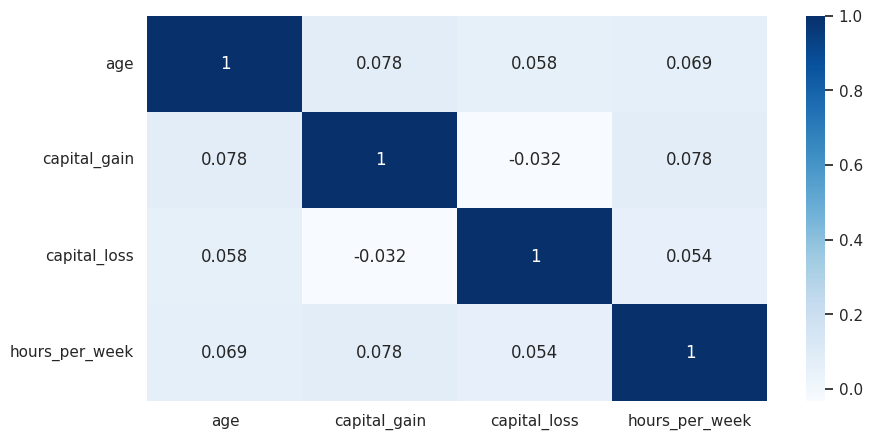

In [ ]:
adult_num = adult[["age","capital_gain", "capital_loss", "hours_per_week"]]

plt.figure(figsize = (10,5))
corr = adult_num.corr()
sns.heatmap(corr,
         xticklabels=corr.columns,
         yticklabels=corr.columns, annot=True, cmap=plt.cm.Blues)

Il valore del coefficiente di correlazione conferma l'analisi visiva degli scatterplot: non ci sono correlazioni significative tra le variabili quantitative.

## Preprocessing

In questa fase, abbiamo compiuto le seguenti modifiche sul dataset.
- Abbiamo trasformato i valori rappresentati da '?' in NaN.
- Dal momento che *education_num* ed *education* rappresentano entrambi i livelli di educazione, abbiamo accorpato le due variabili per contrastare la curse of dimensionality. Abbiamo deciso di rimuovere *education*, lasciando *education_num*. Allo stesso modo, abbiamo creato un dictionary per tradurre *education_num* nel corrispondente valore di *education*
- label encoding delle variabili categoriche
- divisione del dataset in target attribute (*income*) e feature attributes (tutte le altre variabili).

### Cambiamento valori da '?' a NaN


In [ ]:
adult.replace('?', np.nan, inplace = True)
#Using replace to change '?' in NaN
#inplace=T means that the function replaces "?" on the original dataset

adult.head()

,age,workclass,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,90,NaN,HS-grad,9,Widowed,NaN,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,NaN,Some-college,10,Widowed,NaN,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


Nella fase di Data Exploration sono emersi valori non consoni ('?' al posto di NaN e attributo 'fnlwgt'). In questa fase dunque abbiamo rimpiazzato i valori '?' con NaN.



### Aggregazione *education* e *education_num*
*education* è una variabile che contiene i livelli di educazione. *education_num* ha gli stessi valori ma espressi tramite numeri (e i due attributi corrispondono come avevamo mostrato sopra). Dunque, per ridurre la dimensionalità del dataset e rendere la computazione più efficiente, eliminiamo *education* e manteniamo solo *education_num*.
Successivamente, utilizzeremo un dizionario per visualizzare l'attributo

In [ ]:
adult.drop(columns = 'education', inplace = True)
#drop column "education"
#può dare problemi se runnata più volte
adult.head()

,age,workclass,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,90,NaN,9,Widowed,NaN,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,NaN,10,Widowed,NaN,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [ ]:
#Creating dictionary useful for the translation of education_num to the corrisponding level of education
EDU_DICTIONARY = {
  1 : "Preschool",
  2: "1st-4th",
  3: "5th-6th",
  4: "7th-8th",
  5: "9th",
  6: "10th",
  7: "11th",
  8: "12th",
  9: "HS-grad",
  10: "Some-college",
  11: "Assoc-voc",
  12: "Assoc-acdm",
  13: "Bachelors",
  14: "Masters",
  15: "Prof-school",
  16: "Doctorate"
}

### Preprocessing per label encoding delle variabili categoriali

Utilizziamo un label encoder di sklearn per trasformare le variabili categoriali in valori numerici in modo da poter essere utilizzati dal decision tree classifier.

Per la variabile _income_, "<=50k" corrisponde a 0, mentre ">50k" corrisponde a 1.

In [ ]:
from sklearn.preprocessing import LabelEncoder

categorical_columns_toAnalyze = categorical_column_names.copy()
categorical_columns_toAnalyze.remove('education')

adult.head()

encoding_dictionary={}
for col in categorical_columns_toAnalyze:
    encoding_dictionary[col]=LabelEncoder().fit(adult[col]) #For each column, we create one instance in the dictionary. Take care we are only fitting now.

print(encoding_dictionary)
for col in categorical_columns_toAnalyze:
    adult[col] = encoding_dictionary[col].transform(adult[col]) #Be aware we are using the dictionary
print("encoded: \n", adult.head())

#commented decoding for loop
#for col in categorical_columns_toAnalyze:
#    adult[col] = encoding_dictionary[col].inverse_transform(adult[col])
#print("decoded: \n", adult.head())

print("Encoded income:", adult['income'][: 20])

{'workclass': LabelEncoder(), 'marital_status': LabelEncoder(), 'occupation': LabelEncoder(), 'relationship': LabelEncoder(), 'race': LabelEncoder(), 'sex': LabelEncoder(), 'native_country': LabelEncoder(), 'income': LabelEncoder()}
encoded: 
    age  workclass  education_num  marital_status  occupation  relationship  \
0   90          8              9               6          14             1   
1   82          3              9               6           3             1   
2   66          8             10               6          14             4   
3   54          3              4               0           6             4   
4   41          3             10               5           9             3   

   race  sex  capital_gain  capital_loss  hours_per_week  native_country  \
0     4    0             0          4356              40              38   
1     4    0             0          4356              18              38   
2     2    0             0          4356              40   

### Divisione del dataset in feature attributes e target attributes
Ora dividiamo il dataset in *target attribute*, cioè l'etichetta *income*, il cui valore vogliamo predire (che, ricordiamo, può assumere il valore "$\leq 50K$" o "$>50K$") e *feature attributes*, cioè gli attributi su cui si baserà la predizione di *income*.

In [ ]:
#split dataset in feature attributes and target attribute

feature_names = list(adult.columns)
feature_names.remove('income')
class_name = 'income'
X = adult[feature_names] # feature attributes
y = adult[class_name] # target attribute

#X.head()

#y.head()



,age,workclass,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country
0,90,8,9,6,14,1,4,0,0,4356,40,38
1,82,3,9,6,3,1,4,0,0,4356,18,38
2,66,8,10,6,14,4,2,0,0,4356,40,38
3,54,3,4,0,6,4,4,0,0,3900,40,38
4,41,3,10,5,9,3,4,0,0,3900,40,38


# Classificazione


## Splitting Data

Eseguiamo lo split dei dati tra training set e test set.

In [ ]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42) # 70% training and 30% test

X_train.shape, X_test.shape, y_train.shape, y_test.shape

#X_train.head()

((22792, 12), (9769, 12), (22792,), (9769,))

## Decision Tree classifier

Procediamo in tre passaggi:

1.   Costruiamo e inizializziamo il classificatore
2.   Addestriamo con il training set
3.   Validiamo il classificatore sul test set



In [ ]:
# Create Decision Tree classifer object
classifier_dt = DecisionTreeClassifier(random_state=42)

# Train Decision Tree Classifer
classifier_dt = classifier_dt.fit(X_train, y_train)

#Predict the response for test dataset
y_pred_dt = classifier_dt.predict(X_test)
y_pred_dt

array([1, 0, 0, ..., 0, 0, 0])

#### Valutazione risultati decision tree

Visualizziamo la matrice di confusione sulla base dell'esecuzione del Decision Tree classifier, per valutarne la sua bontà.

[[6588  841]
 [ 944 1396]]


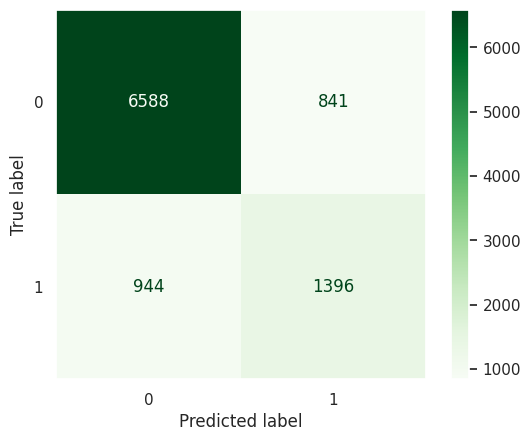

In [ ]:
disp = ConfusionMatrixDisplay.from_estimator(
        classifier_dt,
        X_test,
        y_test,
        cmap=plt.cm.Greens
    )
print(disp.confusion_matrix)
plt.grid(False)
plt.show()

Stampiamo le metriche di valutazione più comuni per l'algoritmo

In [ ]:
print('Accuracy:',metrics.accuracy_score(y_test, y_pred_dt))
print('F1 score:',metrics.f1_score(y_test, y_pred_dt))

Accuracy: 0.8172791483263384
F1 score: 0.6100065545116887


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_dt))

              precision    recall  f1-score   support

           0       0.87      0.89      0.88      7429
           1       0.62      0.60      0.61      2340

    accuracy                           0.82      9769
   macro avg       0.75      0.74      0.75      9769
weighted avg       0.81      0.82      0.82      9769



Abbiamo evitato di visualizzare l'albero di decisione a causa della sua scarsa interpretabilità

#### Hyperparameters tuning

In [ ]:
from sklearn.model_selection import GridSearchCV

# Create Decision Tree classifer object
clf_dt2 = DecisionTreeClassifier(random_state=42)

clf_dt2.get_params()


# Create the parameter grid
dt_params = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20],
    'min_samples_leaf': [2, 4, 8]
}

# cv è is the number of folds for cross validation
grid_search = GridSearchCV(estimator=clf_dt2,
                           param_grid=dt_params,
                           cv=5, n_jobs=-1, verbose=1, scoring = 'f1')

# execution of grid search
grid_search.fit(X_train, y_train)

score_df = pd.DataFrame(grid_search.cv_results_)
score_df.sort_values(by=['rank_test_score'], inplace = True)
score_df.head()

clf_dt_best = grid_search.best_estimator_
clf_dt_best.get_params()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 10,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 8,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 42,
 'splitter': 'best'}

Eseguiamo ancora una volta il Decision Tree Classifier dando in pasto i parametri ottimali computati tramite l'hyperparameters tuning.

In questo modo riusciamo ad aumentare i parametri di Accuracy e F1 score di alcuni decimi.

In [ ]:
# Train Decision Tree Classifer
clf_dt_best = clf_dt_best.fit(X_train,y_train)

# Predict the response for test dataset
y_pred_dt_best = clf_dt_best.predict(X_test)

# Performance
print(classification_report(y_test, y_pred_dt_best))

print('Accuracy:',metrics.accuracy_score(y_test, y_pred_dt_best))
print('F1 score:',metrics.f1_score(y_test, y_pred_dt_best))

              precision    recall  f1-score   support

           0       0.88      0.94      0.91      7429
           1       0.76      0.61      0.68      2340

    accuracy                           0.86      9769
   macro avg       0.82      0.77      0.79      9769
weighted avg       0.85      0.86      0.85      9769

Accuracy: 0.8599651960282526
F1 score: 0.6755218216318785


Visualizziamo la matrice di confusione del Decision Tree eseguito con i parametri ottimali

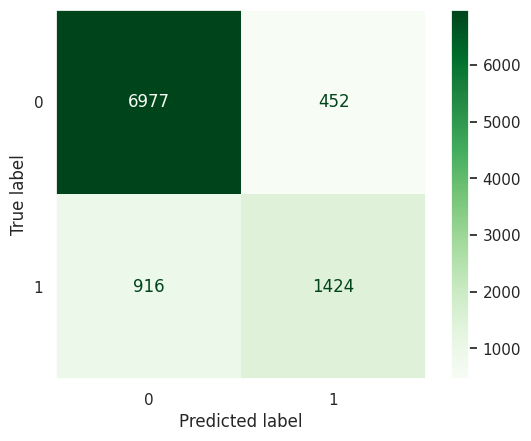

In [ ]:
disp1 = ConfusionMatrixDisplay.from_estimator(clf_dt_best, X_test, y_test, cmap = plt.cm.Greens)
plt.grid(False)
plt.show()


## Random forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

classifier_rf = RandomForestClassifier(random_state=42)

classifier_rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

### Hyperparameters tuning

Anche per Random Forest facciamo hyperparameters tuning per ottimizzare il risultato.

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

rf_params = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20],
    'min_samples_leaf': [2, 4, 8],
    'n_estimators': [100, 200, 300]
}

randomized_search_rf = RandomizedSearchCV(estimator=classifier_rf,
                           param_distributions=rf_params, random_state=42,
                           n_iter=20, cv=5, n_jobs=-1, verbose=1, scoring = 'f1')

randomized_search_rf.fit(X_train, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
                   n_iter=20, n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [None, 10, 20],
                                        'min_samples_leaf': [2, 4, 8],
                                        'n_estimators': [100, 200, 300]},
                   random_state=42, scoring='f1', verbose=1)

In [ ]:
clf_rf_best = randomized_search_rf.best_estimator_
clf_rf_best.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 20,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 200,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

[[7038  391]
 [ 879 1461]]


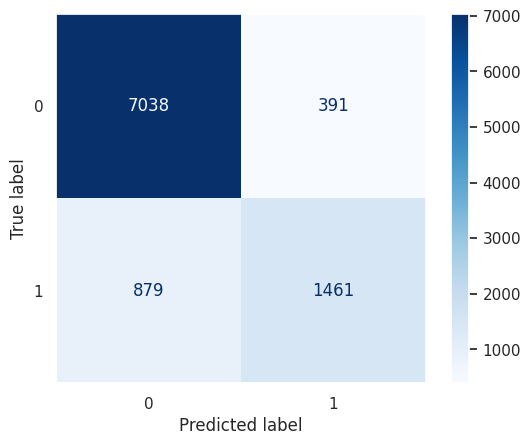

In [ ]:
clf_rf_best = clf_rf_best.fit(X_train, y_train)
y_pred_rf = clf_rf_best.predict(X_test)

disp = ConfusionMatrixDisplay.from_estimator(
        clf_rf_best,
        X_test,
        y_test,
        cmap=plt.cm.Blues
    )
print(disp.confusion_matrix)
plt.grid(False)
plt.show()

In [ ]:

print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

           0       0.89      0.95      0.92      7429
           1       0.79      0.62      0.70      2340

    accuracy                           0.87      9769
   macro avg       0.84      0.79      0.81      9769
weighted avg       0.86      0.87      0.86      9769



In [ ]:
print('Accuracy:',metrics.accuracy_score(y_test, y_pred_rf))
print('F1 score:',metrics.f1_score(y_test, y_pred_rf))

Accuracy: 0.8699969290613164
F1 score: 0.6970419847328244


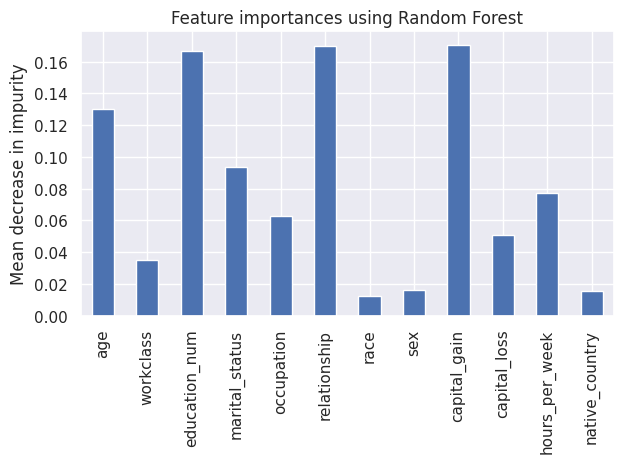

In [ ]:
forest_importances = pd.Series(clf_rf_best.feature_importances_, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(ax=ax)
ax.set_title("Feature importances using Random Forest")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

Dal grafico sopra è evidente che gli attributi più importanti per la classificazione tramite Random Forest sono età, livello di educazione, relazione e *capital_gain*.

## KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

clf_knn = KNeighborsClassifier(n_neighbors=3)

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().set_output(transform="pandas")

scaler.fit(X) # train the standardizer on the entire X
scaled_X_train = scaler.transform(X_train) # and apply the standardizer to both X_train and X_test
scaled_X_test = scaler.transform(X_test)

scaled_X_test.head()

,age,workclass,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country
14160,-0.702455,-0.237906,-0.031360,-0.406212,-0.328461,-0.900181,0.393668,0.703071,-0.14592,-0.21666,-0.035429,0.251378
27048,-1.435581,-0.237906,-0.031360,0.921634,1.057683,0.966947,0.393668,0.703071,-0.14592,-0.21666,-2.060174,0.251378
28868,-0.775768,-0.237906,-0.031360,-0.406212,1.288707,2.211698,0.393668,-1.422331,-0.14592,-0.21666,-0.035429,0.251378
5667,-0.262580,-0.237906,-1.197459,0.921634,1.057683,-0.277805,0.393668,0.703071,-0.14592,-0.21666,0.369519,0.251378
7827,-1.362269,-0.237906,-0.031360,0.921634,-1.483582,0.966947,0.393668,-1.422331,-0.14592,-0.21666,-0.845327,0.744555


In [ ]:
clf_knn.get_params()


{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 3,
 'p': 2,
 'weights': 'uniform'}

In [ ]:
params_knn = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance']
}

# cv is the number of folds for cross validation, n_jobs=-1 asks to use all the processors
grid_search_knn = GridSearchCV(estimator=clf_knn,
                           param_grid=params_knn,
                           cv=5, n_jobs=-1, verbose=1, scoring = 'f1')

In [ ]:
grid_search_knn.fit(scaled_X_train, y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


GridSearchCV(cv=5, estimator=KNeighborsClassifier(n_neighbors=3), n_jobs=-1,
             param_grid={'n_neighbors': [3, 5, 7, 9],
                         'weights': ['uniform', 'distance']},
             scoring='f1', verbose=1)

In [ ]:
clf_knn_best = grid_search_knn.best_estimator_
clf_knn_best.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 9,
 'p': 2,
 'weights': 'uniform'}

[[6793  636]
 [ 958 1382]]


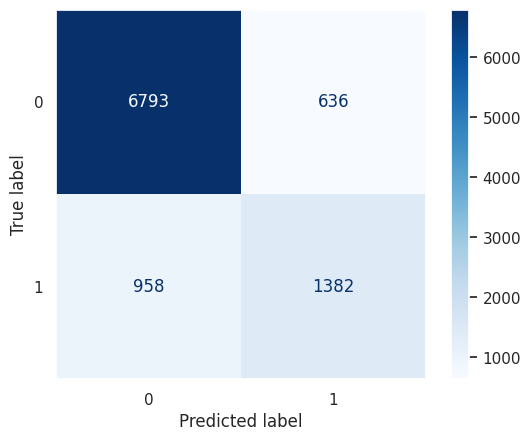

In [ ]:
clf_knn_best = clf_knn_best.fit(scaled_X_train, y_train)
y_pred_knn = clf_knn_best.predict(scaled_X_test)

disp = ConfusionMatrixDisplay.from_estimator(
        clf_knn_best,
        scaled_X_test,
        y_test,
        cmap=plt.cm.Blues
    )
print(disp.confusion_matrix)
plt.grid(False)
plt.show()

In [ ]:
print('Accuracy:',metrics.accuracy_score(y_test, y_pred_knn))
print('F1 score:',metrics.f1_score(y_test, y_pred_knn))

Accuracy: 0.8368307912785341
F1 score: 0.6342358880220285


## Naive Bayes

[[7075  354]
 [1599  741]]


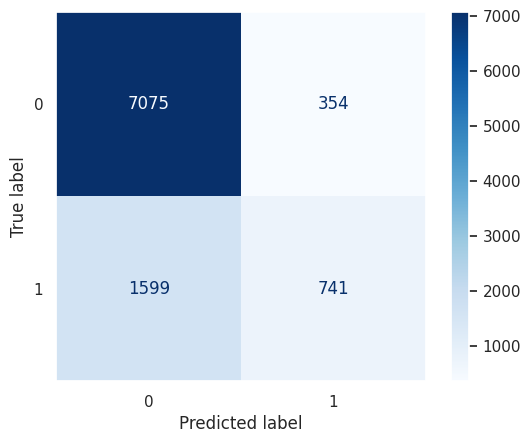

In [ ]:
from sklearn.naive_bayes import GaussianNB

clf_bn = GaussianNB()

clf_bn = clf_bn.fit(X_train, y_train)
y_pred_bn = clf_bn.predict(X_test)

disp = ConfusionMatrixDisplay.from_estimator(
        clf_bn,
        X_test,
        y_test,
        cmap=plt.cm.Blues
    )
print(disp.confusion_matrix)
plt.grid(False)
plt.show()

In [ ]:
print('Accuracy:',metrics.accuracy_score(y_test, y_pred_bn))
print('F1 score:',metrics.f1_score(y_test, y_pred_bn))

Accuracy: 0.8000818916982291
F1 score: 0.4314410480349345


## Sommario metriche di valutazione

In [ ]:
models = {'Decision Tree': y_pred_dt_best,
          'Random Forest': y_pred_rf,
          'kNN': y_pred_knn,
          'Naive Bayes': y_pred_bn}

for descr, y_pred in models.items():
  print(descr+':\n'+classification_report(y_test, y_pred))

Decision Tree:
              precision    recall  f1-score   support

           0       0.88      0.94      0.91      7429
           1       0.76      0.61      0.68      2340

    accuracy                           0.86      9769
   macro avg       0.82      0.77      0.79      9769
weighted avg       0.85      0.86      0.85      9769

Random Forest:
              precision    recall  f1-score   support

           0       0.89      0.95      0.92      7429
           1       0.79      0.62      0.70      2340

    accuracy                           0.87      9769
   macro avg       0.84      0.79      0.81      9769
weighted avg       0.86      0.87      0.86      9769

kNN:
              precision    recall  f1-score   support

           0       0.88      0.91      0.89      7429
           1       0.68      0.59      0.63      2340

    accuracy                           0.84      9769
   macro avg       0.78      0.75      0.76      9769
weighted avg       0.83      0.84      

### Curve ROC

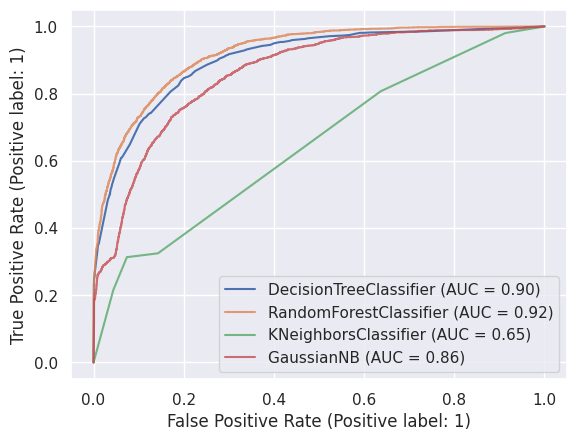

In [ ]:
from sklearn.metrics import RocCurveDisplay

plt.clf()
ax = plt.gca()

disp = RocCurveDisplay.from_estimator(clf_dt_best, X_test, y_test, ax=ax)
disp = RocCurveDisplay.from_estimator(clf_rf_best, X_test, y_test, ax=ax, alpha=0.8)
disp = RocCurveDisplay.from_estimator(clf_knn_best, X_test, y_test, ax=ax, alpha=0.8)
disp = RocCurveDisplay.from_estimator(clf_bn, X_test, y_test, ax=ax, alpha=0.8)

plt.show()

Dal grafico delle Curve ROC (secondo il quale più è alta la curva, più il modello performa bene), è evidente che la classificazione migliore è effettuata tramite Random Forest. Poco più sotto, il modello del Random Forest ha prodotto un risultato buono. Invece KNN è il modello che si è comportato peggio, essendo il più vicino a un classificatore randomico.

# Clustering: un dataset problematico

Il nostro dataset presenta due problemi che rendono il clustering difficile.

1) Poche variabili numeriche. Le variabili numeriche del dataset sono:
- capital_gain
- capital_loss
- hours_per_week
- age

Le variabili numeriche sono fondamentali per il clustering, dal momento che la maggior parte degli algoritmi si basa sulla distanza tra i datapoints. Al contrario, le variabili categoriche nominali, che compongono in prevalenza il nostro dataset, per loro natura non possiedono alcuna informazione sulla distanza tra i valori che possono assumere. Ad esempio, non avrebbe senso parlare della distanza tra "Widowed" e "Divorced".

2) La forte presenza di outliers per le variabili numeriche "capital_gain" e "capital_loss".

Come abbiamo trovato nella data exploration, osservando la distribuzione di queste variabili, si evince che 28330 (circa l'87%!) delle righe del dataset ha zero per entrambi i valori. I valori di "capital_gain" e "capital_loss" diversi da zero sono dunque da considerarsi outliers, perchè si trovano al di sopra del 75% percentile.

La distribuzione di "capital_gain" e "capital_loss" rimane problematica anche dopo la normalizzazione che abbiamo effettuato.

Ad ogni modo, abbiamo tentato di applicare gli algoritmi di clusterizzazione a questi dati, prevedibilmente ottenendo scarsi risultati.

Abbiamo evitato il one-hot encoding sulle variabili categoriali e abbiamo dunque continuato ad usare il label encoding che avevamo già applicato al dataset durante il preprocessing per la classificazione. La ragione di questa scelta sta nel fatto che il one-hot encoding provoca una serie di problemi:
- aumenta la dimensionalità;
- la distanza tra i punti tende a diventare meno significativa;
- i dati diventano sparsi: molte colonne avrebbero valore a zero;
- la performance computazionale peggiora.

## Preprocessing per il clustering

Per arrivare al clustering, dobbiamo prima effettuare un passo di preprocessing del dataset, normalizzando (tramite MinMax) le variabili numeriche.

In [ ]:
from sklearn.preprocessing import MinMaxScaler  # to normalize the dataset
from sklearn.cluster import KMeans               # to use the model

#data normalization for clustering
# we apply the scaler to the numerical variables of the dataset
scaler = MinMaxScaler()
scaled_array = scaler.fit_transform(adult[["age", "capital_gain", "capital_loss", "hours_per_week"]])

# then we transform the numpy.ndarray in a dataframe
scaled_df = pd.DataFrame(scaled_array, columns = ["age", "capital_gain", "capital_loss", "hours_per_week"])

#then we insert the not normalized columns into the normalized dataframe
scaled_df.insert(0, "education_num", adult["education_num"])
scaled_df.insert(0, "workclass", adult["workclass"])
scaled_df.insert(0, "marital_status", adult["marital_status"])
scaled_df.insert(0, "occupation", adult["occupation"])
scaled_df.insert(0, "relationship", adult["relationship"])
scaled_df.insert(0, "race", adult["race"])
scaled_df.insert(0, "sex", adult["sex"])
scaled_df.insert(0, "native_country", adult["native_country"])

scaled_df

,native_country,sex,race,relationship,occupation,marital_status,workclass,education_num,age,capital_gain,capital_loss,hours_per_week
0,38,0,4,1,14,6,8,9,1.000000,0.0,1.000000,0.397959
1,38,0,4,1,3,6,3,9,0.890411,0.0,1.000000,0.173469
2,38,0,2,4,14,6,8,10,0.671233,0.0,1.000000,0.397959
3,38,0,4,4,6,0,3,4,0.506849,0.0,0.895317,0.397959
4,38,0,4,3,9,5,3,10,0.328767,0.0,0.895317,0.397959
...,...,...,...,...,...,...,...,...,...,...,...,...
32556,38,1,4,1,10,4,3,10,0.068493,0.0,0.000000,0.397959
32557,38,0,4,5,12,2,3,12,0.136986,0.0,0.000000,0.377551
32558,38,1,4,0,6,2,3,9,0.315068,0.0,0.000000,0.397959
32559,38,0,4,4,0,6,3,9,0.561644,0.0,0.000000,0.397959


In [ ]:
#copy of non-normalized adult dataset without income column for future plotting
adult_clustering = adult.drop(columns = ["income"])
adult_clustering.head()
#

,age,workclass,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country
0,90,8,9,6,14,1,4,0,0,4356,40,38
1,82,3,9,6,3,1,4,0,0,4356,18,38
2,66,8,10,6,14,4,2,0,0,4356,40,38
3,54,3,4,0,6,4,4,0,0,3900,40,38
4,41,3,10,5,9,3,4,0,0,3900,40,38


Come evidente dal boxplot che segue, nonostante la normalizzazione, in "capital_gain" e "capital_loss" la presenza di outliers rimane elevata

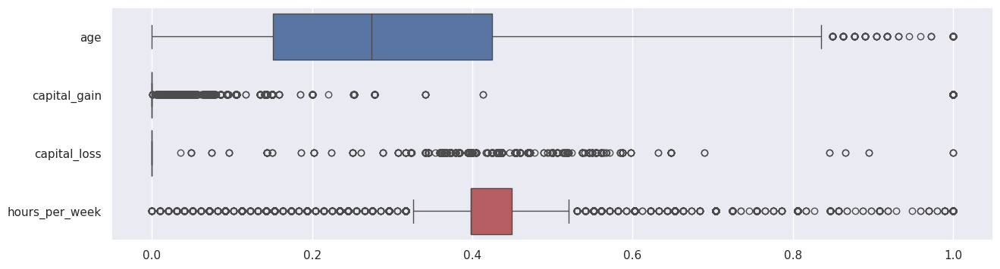

In [ ]:
#boxplot with standardized numerical data
scaled_df_numeric = scaled_df[["age", "capital_gain", "capital_loss", "hours_per_week"]]
plt.figure(figsize = (15,4))
sns.boxplot(data = scaled_df_numeric, orient = "h")
plt.show()

Anche con la normalizzazione tramite StandardScaler, il problema degli outliers permane.

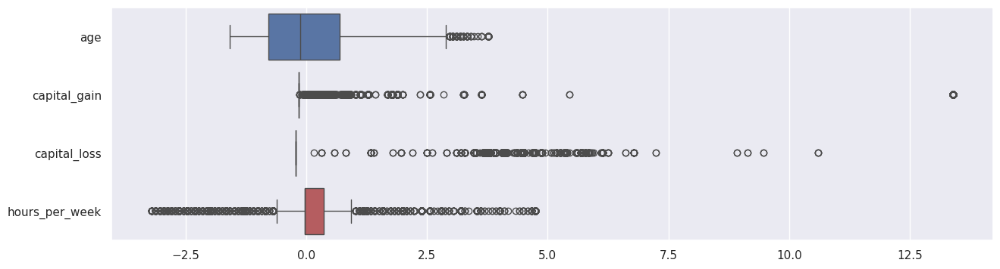

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans               # to use the model

#data normalization for clustering
# we apply the scaler to the numerical variables of the dataset
scaler = StandardScaler()
zscaled_array = scaler.fit_transform(adult[["age", "capital_gain", "capital_loss", "hours_per_week"]])

# then we transform the numpy.ndarray in a dataframe
zscaled_df = pd.DataFrame(zscaled_array, columns = ["age", "capital_gain", "capital_loss", "hours_per_week"])

#then we insert the not normalized columns into the normalized dataframe
zscaled_df.insert(0, "education_num", adult["education_num"])
zscaled_df.insert(0, "workclass", adult["workclass"])
zscaled_df.insert(0, "marital_status", adult["marital_status"])
zscaled_df.insert(0, "occupation", adult["occupation"])
zscaled_df.insert(0, "relationship", adult["relationship"])
zscaled_df.insert(0, "race", adult["race"])
zscaled_df.insert(0, "sex", adult["sex"])
zscaled_df.insert(0, "native_country", adult["native_country"])

zscaled_df

zscaled_df_numeric = zscaled_df[["age", "capital_gain", "capital_loss", "hours_per_week"]]
plt.figure(figsize = (15,4))
sns.boxplot(data = zscaled_df_numeric, orient = "h")
plt.show()

Nonostante i limiti, StandardScaler (ovvero lo Scaler tramite Z-score) è di solito più adatto a gestire gli outlier, quindi adotteremo il dataset normalizzato in questo modo per effettuare l'analisi con l'algoritmo di clustering.

La ricerca di cluster all'interno di questo dataset potrebbe portarci a due risultati possibili.

Potremmo ritrovare nella clusterizzazione le etichette di classe (income >50K o <= 50K) che avevamo rimosso nel preprocessing. In tal caso, per validare i risultati potremmo servirci dell'ARI, che confronta una clusterizzazione con l'etichetta di classe vera presente nel dataset. Tuttavia, se l'algoritmo produce due clusters, non significa necessariamente che i cluster trovati corrispondano alle etichette di classe. Potrebbe darsi, infatti, che l'algoritmo abbia trovato due cluster significativi ma diversi dalle etichette.

In alternativa, potremmo arrivare a più di due clusters, che interpreteremo poi visivamente tramite pairplot.

## Scelta dell'algoritmo di clustering

K-means non è adeguato per il nostro dataset, per i seguenti motivi.

In primo luogo, i nostri dati contengono molti outliers. Dal momento che K-means si basa sulla media e la media è molto influenzata dagli outliers, la ricerca del centroide potrebbe essere distort.

In secondo luogo, K-means funziona male con cluster che possono avere dimensioni diverse. Nel caso delle etichette di "income" (che possiamo intendere come un possibile target della ricerca di cluster), la frequenza delle due etichette è sbilanciata nel dataset (circa 1/5 delle righe hanno income >50K; circa 4/5 hanno income <=50K).  

Inoltre, anche l'algoritmo gerarchico agglomerativo non è adeguato per il nostro dataset, in quanto il nostro dataset ha molti records e questo tipo di algoritmo ha una complessità computazionale elevata sia in termini di spazio che di tempo.

DBScan, in conclusione, risulta l'alternativa migliore, anche in ragione del fatto che è un algoritmo che resiste agli outliers, gestisce bene clusters di dimensioni diverse e non dovrebbe dare problemi di efficienza.

### DBSCAN

#### Proviamo diversi eps

Per prima cosa scegliamo come *minPts* il doppio del numero di colonne analizzate (*A Density-Based Algorithm for Discovering Clusters in Large Spatial Databases with Noise* - Sander, 1998)

Sulla base del valore di *minPts* scelto, calcoliamo le distanze dei nearest neighbors e plottiamo il grafico per la scelta di eps.

Dal grafico ne risulta che abbiamo un gomito in corrispondenza di eps = 2, scegliamo quindi questo valore per effettuare una prima analisi

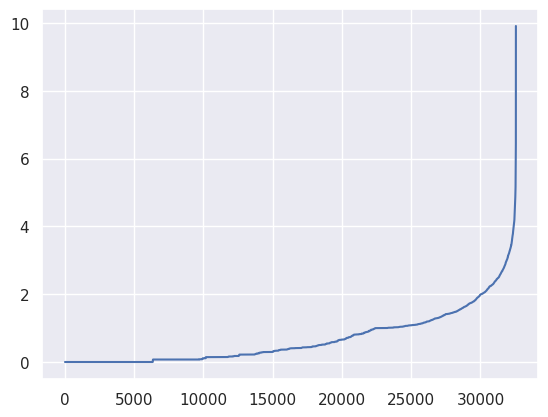

In [ ]:
#find best eps values by plotting
from sklearn.neighbors import NearestNeighbors
from matplotlib import pyplot as plt

neighbors = NearestNeighbors(n_neighbors=len(zscaled_df.columns)* 2)
neighbors_fit = neighbors.fit(zscaled_df)
distances, indices = neighbors_fit.kneighbors(zscaled_df)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [ ]:
## DBscan
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=2, min_samples=len(zscaled_df.columns)* 2)
dbscan.fit(zscaled_df)

DBSCAN(eps=2, min_samples=24)

In [ ]:
print(set(dbscan.labels_))

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, -1}


Dopo l'analisi si ottiene un silhouette score negativo, che indica una possibile clusterizzazione scorretta

In [ ]:
score = metrics.silhouette_score(zscaled_df, dbscan.labels_)
print(score)

-0.2905265757479584


Dal momento che l'ARI è una misura di qualità del clustering supervisionata, e avendo noi solamente due etichette di ground truth (cioè i valori assunti dalla variabile *income*), risulta poco sensato fare un confronto con i cluster trovati dalla precedente esecuzione di DBscan (13 cluster).

Tuttavia abbiamo provato a eseguire il calcolo dell'indice ARI, pur non riuscendo a dare una buona interpretazione.

In [ ]:
from sklearn.metrics import adjusted_rand_score
ari = adjusted_rand_score(adult['income'].tolist(), dbscan.labels_)
print(ari)

0.014931918118857837


Come si può vedere nel pairplot a seguire, per la variabile categorica *native_country*, vi è una corrispondenza quasi univoca tra i nati negli USA (codificati col valore 38) e l'appartenenza ad un certo cluster

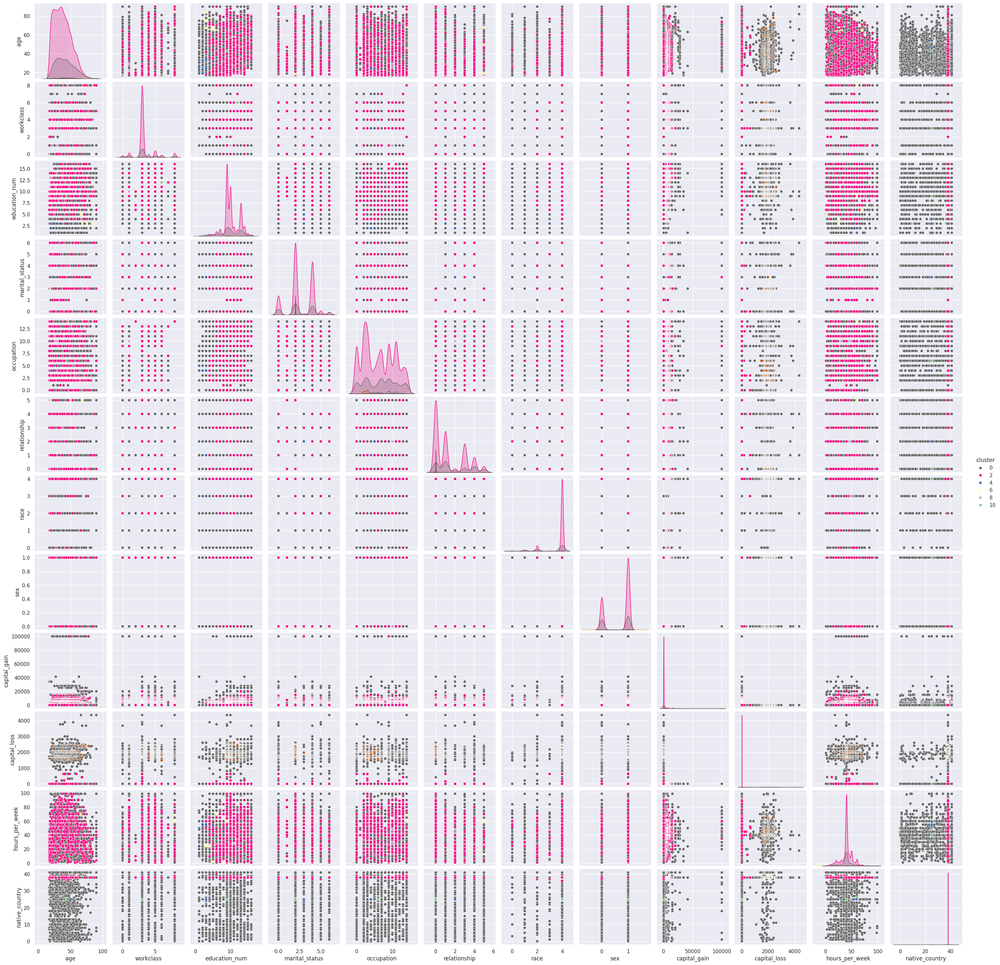

In [ ]:
labels = dbscan.labels_
adult_clustering['cluster'] = labels
adult_clustering.head()
# decoding for loop
#for col in categorical_columns_toAnalyze:
#    adult_clustering[col] = encoding_dictionary[col].inverse_transform(adult[col])
#print("decoded: \n", adult_clustering.head())

sns.pairplot(data = adult_clustering, hue = "cluster", palette = "Accent_r")
plt.show()

Ad ogni modo, tentiamo di vedere i risultati che si ottengono impostando un numero di minPts maggiore.

Attraverso il metodo di scelta dell'eps ottimale tramite il grafico come sopra, con un minPts = 6000 si ottiene comunque un eps ottimale == 2.

Con minPts == 6000 e eps == 10 riusciamo ad ottenere valori positivi alti di silhouette-score (e.g. 0.6951). Tuttavia visualizzando i risultati si capisce che l'algoritmo riesce così ad arrivare alla divisione in due cluster molto sbilanciati (uno molto piccolo ed uno avente più del 99% dei record del dataset)

Con eps = 10 abbiamo ss di 0.69 e un ARI comunque molto basso, che indica una corrispondenza casuale tra classi e cluster.

In [ ]:
##lets try with different eps values

eps_to_test = [x for x in range(9, 11, 1)] # [2,3,4, ..., 14]
silhouette_scores = {}

model_dbscan_eps

for eps in eps_to_test:
    model_dbscan_eps = DBSCAN(eps=eps, min_samples=6000)
    model_dbscan_eps.fit(zscaled_df)
    labels_eps = model_dbscan_eps.labels_
    score_eps = metrics.silhouette_score(zscaled_df, labels_eps)
    silhouette_scores[eps] = score_eps
    ari = adjusted_rand_score(adult['income'].tolist(), model_dbscan_eps.labels_)
    print("ARI score for DBSCAN with eps = %5.4f\tSS: %5.4f: " % (eps, score_eps), ari)
    print("Tested DBSCAN with eps = %5.4f\tSS: %5.4f" % (eps, score_eps))
    print("The labels for this iteration are ", set(labels_eps))

print("Done!")

ARI score for DBSCAN with eps = 9.0000	SS: 0.6768:  0.013868343133219
Tested DBSCAN with eps = 9.0000	SS: 0.6768
The labels for this iteration are  {0, -1}
ARI score for DBSCAN with eps = 10.0000	SS: 0.6951:  0.00698063673005177
Tested DBSCAN with eps = 10.0000	SS: 0.6951
The labels for this iteration are  {0, -1}
Done!


In [ ]:
#counting del numero di record assegnati ai cluster
arr = labels.tolist();
print("-1: ", arr.count(-1))
print("0: ", arr.count(0))

-1:  1260
0:  31301


Plotting del dbscan con eps = 10 (massimizzando il Silhouette-score)

Questa visualizzazione include le variabili categoriche (precedentemente codificate), benchè sappiamo che non sia formalmente corretto visualizzare la codifica di una variabile nominale.

Ad ogni modo abbiamo ritenuto potesse essere utile per dare una interpretazione ulteriore all'output del clustering.

Da questo plot si evince la scarsa qualità del clustering ottenuto (dovuto alla scarsa qualità dei dati).
Ad esempio, guardando la variabile *native_country*, sembra esserci una divisione dei cluster tra le due metà dei valori numerici della suddetta variabile, che non è sensata essendo solo una codifica di una variabile categoriale nominale.

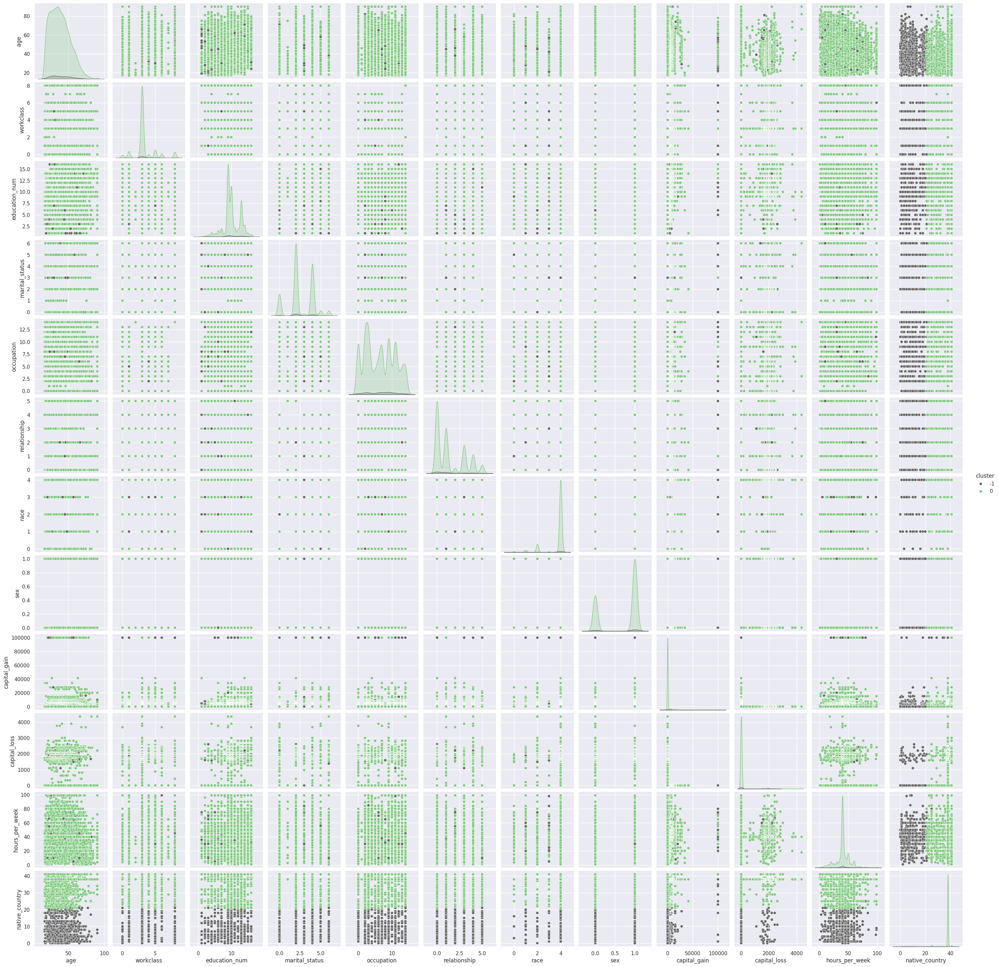

In [ ]:
labels = model_dbscan_eps.labels_
adult_clustering['cluster'] = labels

adult_clustering.head()
# decoding for loop
#for col in categorical_columns_toAnalyze:
#    adult_clustering[col] = encoding_dictionary[col].inverse_transform(adult[col])
#print("decoded: \n", adult_clustering.head())

sns.pairplot(data = adult_clustering, hue = "cluster", palette = "Accent_r")
plt.show()